In [1]:
import sys
sys.path.append('..')
from tool import *
mt=[]
for month in range(1,13):
    now=datetime.datetime.strptime(f'2001-{month}-1', '%Y-%m-%d')
    month_time=(now+relativedelta(months=1)-now).total_seconds()
    mt.append(month_time)
mt=np.array(mt)

In [38]:
# Print integrated RF
for is_snowfree in ['snow']:
    print('')
    print(is_snowfree)

    kk=[]
    result=torch.load(f'../data/curve_energy_{is_snowfree}.pth')
    for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
        for key in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
            # print(key,np.array(result[f'{landcover_type}_{key}']).sum())
            kk.append(np.array(result[f'{landcover_type}_{key}']).sum())
    print('integrated RF','min:',np.array(kk).min())
    print('integrated RF','max:',np.array(kk).max())
    print('integrated RF','mean:',np.array(kk).mean())
    print('integrated RF','median:',np.median(np.array(kk)))


snow
integrated RF min: -3.3627312026613195e+22
integrated RF max: -2.32037336103781e+22
integrated RF mean: -2.918137214504863e+22
integrated RF median: -3.0279367157662318e+22


In [36]:
# Print integrated RF
for is_snowfree in ['snow','snowfree','snowdynamic']:
    result=torch.load(f'../data/curve_energy_{is_snowfree}.pth')
    kk=[]
    for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
        for key in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
            kk.append(result[f'{landcover_type}_{key}'])
    kk=np.stack(kk)/365/24/3600/5.1e8/1e6
    kk_median=np.median(kk,axis=0)
    kk_mean=np.mean(kk,axis=0)
    kk_min=np.min(kk,axis=0)
    kk_max=np.max(kk,axis=0)
    print(kk_min[-1],kk_mean[-1],kk_max[-1])

-0.158281669164901 -0.14213330019017337 -0.11365001537432372
-0.18572885704386433 -0.1619973505656138 -0.1374578630162749
0.005782213675176734 0.019864050375440343 0.028015667530148048


In [3]:
plt.figure(figsize=(28,11),dpi=600)
is_snowfree='snow'
result=torch.load(f'../data/curve_energy_{is_snowfree}.pth')
kk=[]
for key in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
    for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
        kk.append(result[f'{landcover_type}_{key}'])
kk=np.stack(kk)/365/24/3600/5.1e8/1e6
kk_median=np.median(kk,axis=0)
kk_mean=np.mean(kk,axis=0)
kk_min=np.min(kk,axis=0)
kk_max=np.max(kk,axis=0)
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],kk_min,kk_max,color='thistle',alpha=0.6)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk_mean,color='plum',alpha=0.7,linewidth=3,label='Global')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
is_snowfree='snowfree'
result=torch.load(f'../data/curve_energy_{is_snowfree}.pth')
kk=[]
for key in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
    for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
        kk.append(result[f'{landcover_type}_{key}'])
kk=np.stack(kk)/365/24/3600/5.1e8/1e6
kk_median=np.median(kk,axis=0)
kk_mean=np.mean(kk,axis=0)
kk_min=np.min(kk,axis=0)
kk_max=np.max(kk,axis=0)
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],kk_min,kk_max,color='gray',alpha=0.3)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk_mean,color='gray',alpha=0.6,linewidth=3,label='Snow-free regions')
is_snowfree='snowdynamic'
result=torch.load(f'../data/curve_energy_{is_snowfree}.pth')
kk=[]
for key in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
    for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
        kk.append(result[f'{landcover_type}_{key}'])
kk=np.stack(kk)/365/24/3600/5.1e8/1e6
kk_median=np.median(kk,axis=0)
kk_mean=np.mean(kk,axis=0)
kk_min=np.min(kk,axis=0)
kk_max=np.max(kk,axis=0)
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],kk_min,kk_max,color='deepskyblue',alpha=0.3)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk_mean,color='deepskyblue',alpha=0.6,linewidth=3,label='Snow dynamics')
plt.grid(linestyle='-.')
plt.legend(fontsize=20)
plt.xlim(('2001', '2020'))
plt.xticks(fontsize=20,rotation=45)
plt.yticks(fontsize=20)
plt.ylabel(r'Albedo-induced radiative forcing (W/m$^2$)',fontsize=20)
plt.savefig('../figure/rf_curve.pdf',dpi=600)
plt.show()

LCCS1


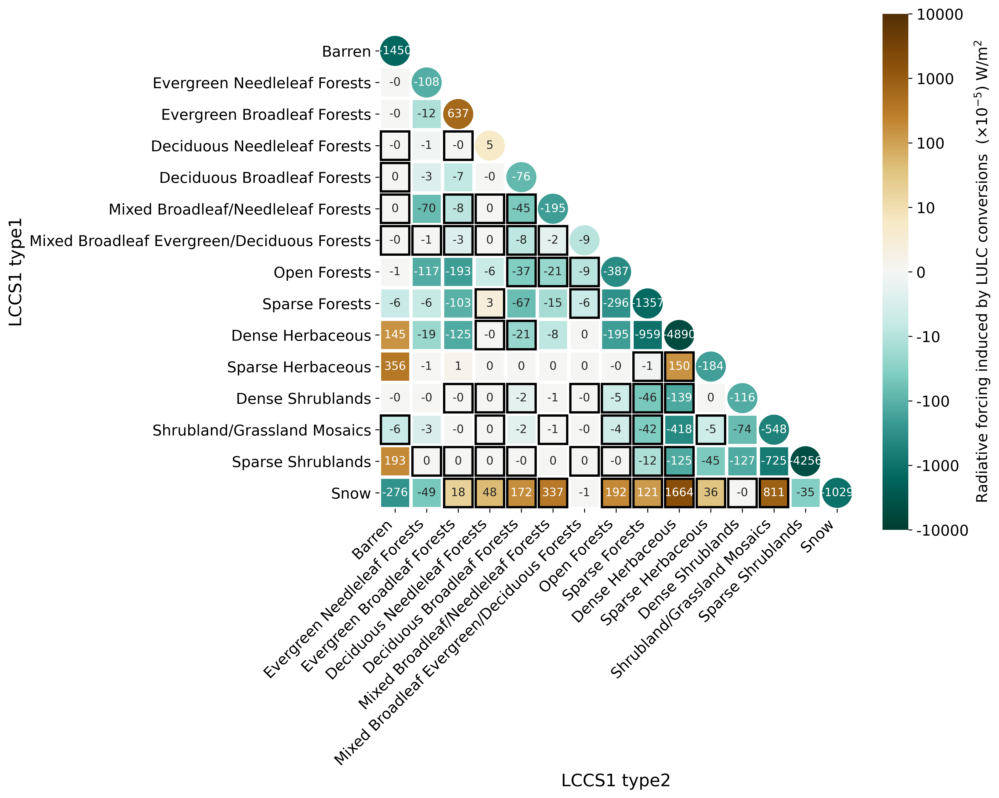

LCCS2


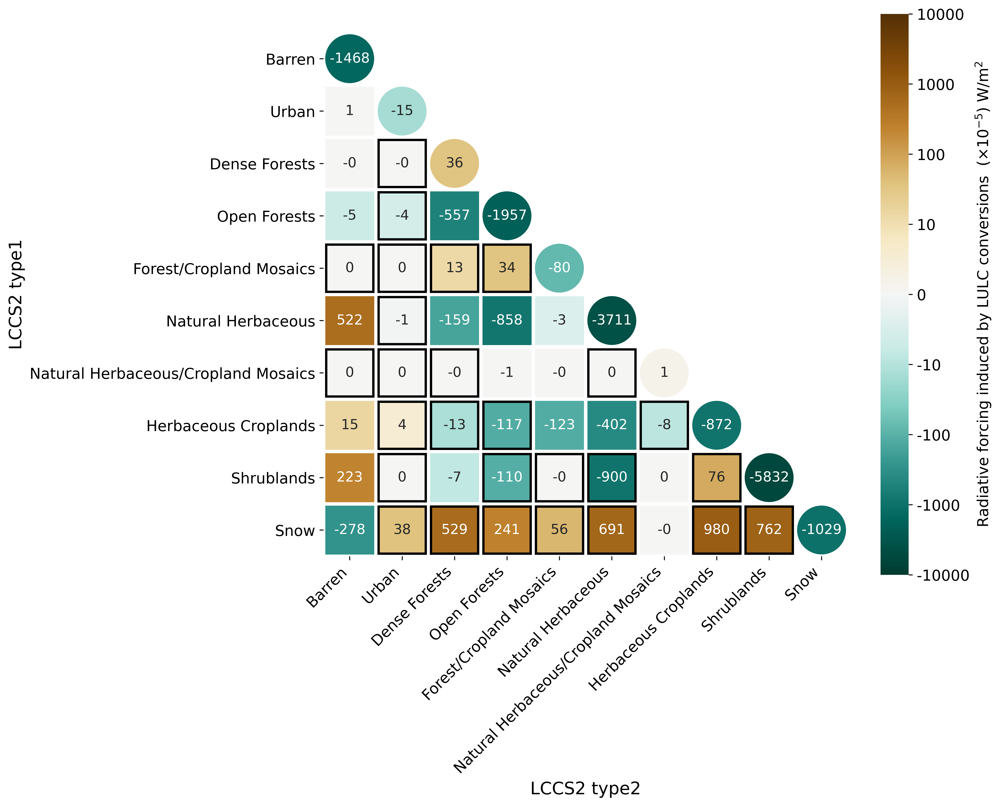

LCCS3


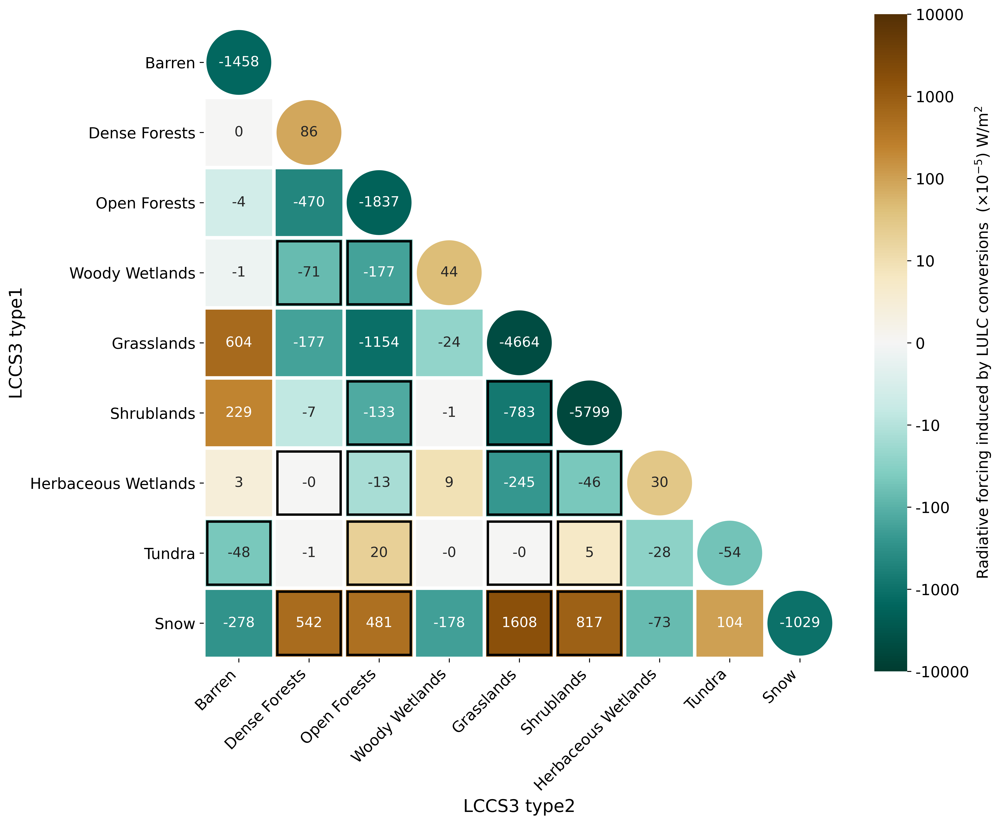

IGBP


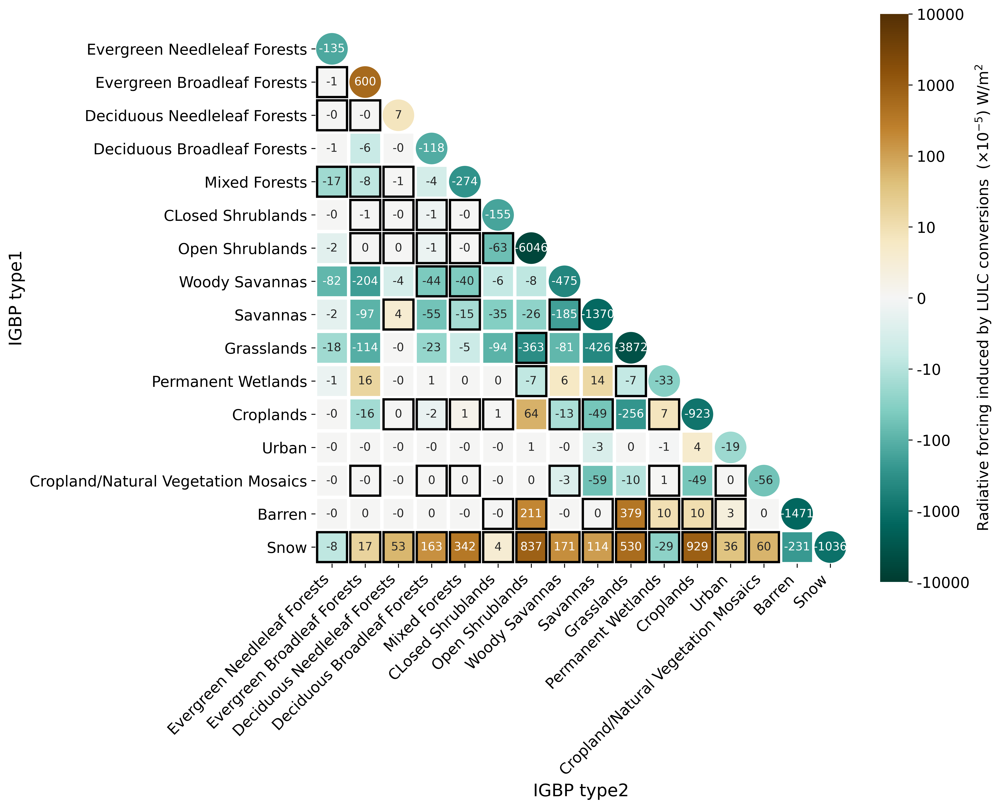

In [1]:
#RF induced by conversion and non-conversion pathways
result2=torch.load(f'../data/RF_ConfusionMatrix_2020.pth')
result3={}
for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
    print(landcover_type)
    if landcover_type=='LCCS2':
        lc_len=10
    elif landcover_type=='LCCS3':
        lc_len=9
    elif landcover_type=='IGBP':
        lc_len=16
    elif landcover_type=='LCCS1':
        lc_len=15
    kk=[]
    for k in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
        kk.append(result2[f'{landcover_type}_{k}'])
    dif_al=np.mean(np.stack(kk),axis=0)
    dif_al_tranf=np.nansum(dif_al.reshape(-1,lc_len+1,lc_len+1),axis=0)
    dif_al_tranf=np.delete(dif_al_tranf,1,axis=0)
    dif_al_tranf=np.delete(dif_al_tranf,1,axis=1)
    dif_al_tranf2=np.zeros((lc_len,lc_len))
    for x in range(lc_len):
        for y in range(lc_len):
            dif_al_tranf2[x,y]=(dif_al_tranf[y,x]+dif_al_tranf[x,y])
            dif_al_tranf2[y,x]=np.nan
    for i in range(lc_len):
        dif_al_tranf2[i,i]=dif_al_tranf[i,i]
    result3[landcover_type]=dif_al_tranf2
    def to_log(k):
        k=k*1e5
        if np.isnan(k):
            return np.nan
        else:
            if k>=0:
                k=np.log10(k)
                if k<0:
                    k=0
                return k
            else:
                k=np.log10(k*(-1))
                if k<0:
                    k=0
                return -k
    dif_al_tranf3=dif_al_tranf2.copy()
    for x in range(lc_len):
        for y in range(lc_len):
            dif_al_tranf3[x,y]=to_log(dif_al_tranf3[x,y])
    dif_al_tranf4=dif_al_tranf2.copy()
    dif_al_tranf4=np.round(dif_al_tranf4*1e5)
    _,sza_L=torch.load(root_path+'sza_and_szaL.pth')
    mask=np.zeros((12,20,lc_len+1,180,360))
    for y in range(2001,2021):
        for m in range(1,13):
            mask[m-1,y-2001]=np.expand_dims(sza_L[y-2001,m-1],0).repeat(lc_len+1,axis=0)
    data_m=torch.load(f"/data2/hzy/albedo2/confuse_matrix/confuse_matrix_2020_{landcover_type}.pth")
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(lc_len+1,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=2]=np.nan
    data_m=month_fill(data_m,mask_t>=2)
    data_y=np.nanmean(data_m,axis=0)
    transf=np.nansum(data_y,axis=0)
    transf=np.nansum(transf,axis=0)
    transf2=transf.copy()
    transf22=np.zeros((lc_len+1,lc_len+1))
    for i in range(lc_len+1):
        transf22[i,i]=0
    for x in range(lc_len+1):
        for y in range(lc_len+1):
            transf22[x,y]=(transf2[y,x]-transf2[x,y])
            transf22[y,x]=0
    transf22[transf22==0]=np.nan
    transf3=np.zeros((lc_len,lc_len))
    transf3[:1,:1]=transf22[:1,:1]
    transf3[1:,:1]=transf22[2:,:1]

    transf3[:1,1:]=transf22[:1,2:]
    transf3[1:,1:]=transf22[2:,2:]
    box_indices=[]
    for x in range(lc_len):
        for y in range(lc_len):  
            if transf3[x,y]<0:
                box_indices.append((x,y))  
    def heatmap_with_boxes(data, box_indices, ax=None, **kwargs):
        if not ax:
            ax = plt.gca()
        rows, cols = data.shape
        for i, j in box_indices:
            x = j
            y = i
            rect = Rectangle((x+0.05, y+0.05), 1-0.1, 1-0.1, linewidth=2, edgecolor='black', facecolor='none')
            ax.add_patch(rect)
        ax.set_aspect('equal', adjustable='box')
    def heatmap_with_c(data, box_indices, ax=None, **kwargs):
        if not ax:
            ax = plt.gca()
        rows, cols = data.shape
        cmap = plt.get_cmap('BrBG_r')
        norm = plt.Normalize(vmin=-4, vmax=4)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        for i, j in box_indices:
            x = j
            y = i
            value = data[x,y]
            color = sm.to_rgba(value)
            rect = Circle((x+0.5, y+0.5), 0.45, linewidth=1.5, edgecolor=color, facecolor=color)
            rect2 = Rectangle((x, y), 1, 1, linewidth=2,  facecolor='white')
            ax.add_patch(rect2)
            ax.add_patch(rect)
        ax.set_aspect('equal', adjustable='box')
    f, ax = plt.subplots(figsize=(12, 10),dpi=600)
    if landcover_type in ['LCCS2','LCCS3']:
        sns.heatmap(dif_al_tranf3, ax=ax,vmin=-4,vmax=4,fmt='g',
                    annot_kws={"fontsize":12},square=True,cmap='BrBG_r',
                    annot=dif_al_tranf4,linewidths=3,cbar=True)
    else:
        sns.heatmap(dif_al_tranf3, ax=ax,vmin=-4,vmax=4,fmt='g',
                    annot_kws={"fontsize":10},square=True,cmap='BrBG_r',
                    annot=dif_al_tranf4,linewidths=3,cbar=True)
    ax.set_ylabel(f'{landcover_type} type1',fontsize=15)  #设置纵轴标签
    ax.set_xlabel(f'{landcover_type} type2',fontsize=15)  #设置横轴标签
    ll=[type_code[landcover_type][i] for i in range(lc_len+1) if i!=1]
    plt.yticks([i+0.5 for i in range(lc_len)],ll)
    plt.xticks([i+0.5 for i in range(lc_len)],ll)
    plt.yticks(rotation=360, horizontalalignment='right',fontsize=13)
    plt.xticks(rotation=45, horizontalalignment='right',fontsize=13)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([-4,-3,-2,-1, 0,1,2,3, 4])
    cbar.set_ticklabels(['-10000','-1000','-100','-10', '0','10','100','1000', '10000'],fontsize=13)
    cbar.set_label(r"Radiative forcing induced by LULC conversions  ($\times 10^{-5}$) W/m$^2$",fontsize=13)
    heatmap_with_c(dif_al_tranf3, [(i,i) for i in range(lc_len)], ax=ax)
    heatmap_with_boxes(dif_al_tranf3, box_indices, ax=ax)
    plt.tight_layout()
    f.savefig(f'../figure/RF_contribution_{landcover_type}.pdf',dpi=600,bbox_inches='tight')
    plt.show()

In [46]:
'''
对比Ghimire和IPCC（CMIP5/6模拟） 1750-2019土地变化都导致0.15w/m2
大概-0.00056 w/m2/year

'''
result3=torch.load('RF_ConfusionMatrix_2020_bidirectional.pth')
k=result3['IGBP'].copy()
k[-1,:]=0
k[:,-1]=0
for i in range(k.shape[0]):
    k[i,i]=0
k[-1,:]=0
conversion_snowfree=np.nansum(k[:-1])#除雪之外的土地转换
all=conversion_snowfree-np.nansum(k[:5,:5])#森林间的转换
all-=np.nansum(k[5:10,5:10])#森林间的转换
all-=k[-3,-5]#农田/自然混合类型和农田的转换
all-=(np.nansum(k[-2,:])+np.nansum(k[:,-2]))#裸土相关转换
print(all)
print(all/19)

-0.010162966532052526
-0.0005348929753711855


In [39]:
'''
对比NC 2001-2018城市扩张导致0.00017w/m2
'''
result2={}
for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
    print(landcover_type)
    if landcover_type=='LCCS2':
        lc_len=10
    elif landcover_type=='LCCS3':
        lc_len=9
    elif landcover_type=='IGBP':
        lc_len=16
    elif landcover_type=='LCCS1':
        lc_len=15 
    kka=np.load(f'/data2/hzy/albedo2/data/confusematrix_albedo-multiply-area-multiply-time_{landcover_type}.npy')
    kka=kka[-3]
    kernels=torch.load(f"/data2/hzy/albedo2/kernel/kernels.pth")
    rr=[]
    for k in tqdm(['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5', 'min', 'max', 'mean', 'median']):
        kka2=kka*kernels[k]
        rr.append(np.nansum(kka2)/365/24/3600/5.1e8)
        result2[f'{landcover_type}_{k}']=np.nansum(kka2.reshape((lc_len+1,lc_len+1,-1)),axis=-1)/365/24/3600/5.1e8
torch.save(result2,f'RF_ConfusionMatrix_2018.pth')
result2=torch.load(f'RF_ConfusionMatrix_2018.pth')
result3={}
for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
    print(landcover_type)
    if landcover_type=='LCCS2':
        lc_len=10
    elif landcover_type=='LCCS3':
        lc_len=9
    elif landcover_type=='IGBP':
        lc_len=16
    elif landcover_type=='LCCS1':
        lc_len=15
    kk=[]
    for k in ['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6', 'ERAI', 'ERA5']:
        kk.append(result2[f'{landcover_type}_{k}'])
    dif_al=np.mean(np.stack(kk),axis=0)
    dif_al_tranf=np.nansum(dif_al.reshape(-1,lc_len+1,lc_len+1),axis=0)
    dif_al_tranf=np.delete(dif_al_tranf,1,axis=0)
    dif_al_tranf=np.delete(dif_al_tranf,1,axis=1)
    dif_al_tranf2=np.zeros((lc_len,lc_len))
    for x in range(lc_len):
        for y in range(lc_len):
            dif_al_tranf2[x,y]=(dif_al_tranf[y,x]+dif_al_tranf[x,y])
            dif_al_tranf2[y,x]=np.nan
    for i in range(lc_len):
        dif_al_tranf2[i,i]=dif_al_tranf[i,i]
    result3[landcover_type]=dif_al_tranf2
torch.save(result3,'RF_ConfusionMatrix_2018_bidirectional.pth')

result3=torch.load('../data/RF_ConfusionMatrix_2018_bidirectional.pth')
k=result3['IGBP']
print('IGBP',np.nansum(k[-4,:])+np.nansum(k[:,-4])-2*k[-4,-4])
result3=torch.load('../data/RF_ConfusionMatrix_2018_bidirectional.pth')
k=result3['LCCS2']
print('LCCS2',np.nansum(k[1,:])+np.nansum(k[:,1])-2*k[1,1])

IGBP 0.00014385823949326752
LCCS2 0.0001233310659485079


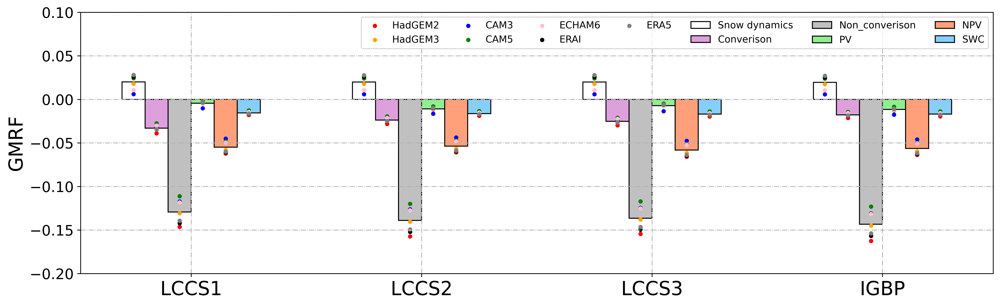

In [33]:
result={}
result2=torch.load(f'../data/RF_ConfusionMatrix_2020.pth')
def get_bar(landcover_type,key):
    a=result2[f'{landcover_type}_{key}'].copy()
    snow=a.sum()-a[:-1,:-1].sum()
    a=a[:-1,:-1]
    a_sum=a.sum()
    for i in range(a.shape[0]):
        a[i,i]=0
    return snow,a.sum(),a_sum-a.sum()
for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']:
    result[landcover_type]=torch.load(f'../data/RF_model_dict_{landcover_type}.pth')
plt.figure(figsize=(17,5),dpi=600)
x = range(4)
x=[x,[i + 0.1 for i in x],[i + 0.2 for i in x],[i + 0.3 for i in x],[i + 0.4 for i in x],[i + 0.5 for i in x]]
plt.bar(x[0], [get_bar(landcover_type,'mean')[0] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1,color='white',edgecolor='black',label='Snow dynamics')
plt.bar(x[1], [get_bar(landcover_type,'mean')[1] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1,color='plum',edgecolor='black',label='Converison')
plt.bar(x[2], [get_bar(landcover_type,'mean')[2] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1,color='silver',edgecolor='black',label='Non_converison')
plt.bar(x[3], [result[landcover_type][f'{landcover_type}_NDVI_mean_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1,color='lightgreen',edgecolor='black',label='PV')
# 向右移动0.2, 柱状条宽度为0.2
plt.bar(x[4], [result[landcover_type][f'{landcover_type}_SSI_mean_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1, color='lightsalmon',edgecolor='black',label='NPV')
plt.bar(x[5], [result[landcover_type][f'{landcover_type}_NMDI_mean_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], width=0.1, color='lightskyblue',edgecolor='black',label='SWC')
cs=['r','orange','b','g','pink','black','gray']
ks=['HadGEM2', 'HadGEM3', 'CAM3', 'CAM5', 'ECHAM6','ERAI','ERA5']
for i in range(7):
    key=ks[i]
    c=cs[i]
    plt.scatter(x[0],[get_bar(landcover_type,key)[0] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12,label=key)
    plt.scatter(x[1],[get_bar(landcover_type,key)[1] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12)
    plt.scatter(x[2],[get_bar(landcover_type,key)[2] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12)

    plt.scatter(x[3],[result[landcover_type][f'{landcover_type}_NDVI_{key}_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12)
    plt.scatter(x[4],[result[landcover_type][f'{landcover_type}_SSI_{key}_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12)
    plt.scatter(x[5],[result[landcover_type][f'{landcover_type}_NMDI_{key}_all'] for landcover_type in ['LCCS1','LCCS2','LCCS3','IGBP']], color=c,s=12)
plt.scatter([0],[0], color='white',s=0,label=' ')
plt.xticks([i-0.05 for i in x[3]], ['LCCS1','LCCS2','LCCS3','IGBP'],fontsize=20)
plt.legend(fontsize=10,ncol=7)
plt.ylim((-0.2, 0.1))
plt.yticks(fontsize=15)
plt.grid(linestyle='-.')
plt.ylabel(r'GMRF',fontsize=20)
plt.savefig(f'../figure/RF_bar.pdf',dpi=600,bbox_inches='tight')
plt.show()